In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import savgol_filter
import umap
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

from torchvision.utils import make_grid

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
os.chdir('../IConNet/')
os.getcwd()

'/home/linh/projects/IConNet'

In [5]:
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"
import gc
import sys
import numpy as np
from tqdm import tqdm

In [6]:
data_dir = '../data/data_preprocessed/ravdess/preprocessed/'
sr = 16000

data_x = np.load(f'{data_dir}ravdess.audio16k.npy', allow_pickle=True)
data_y = np.load(f'{data_dir}ravdess.label_emotion.npy', allow_pickle=True)
print(data_x.shape)
print(data_y.shape)
np.unique(data_y)

(1440,)
(1440,)


array([0, 1, 2, 3, 4, 5, 6, 7])

In [7]:
classnames = np.load(f'{data_dir}ravdess.classnames.npy', allow_pickle=True)
classnames

array(['neutral', 'calm', 'happy', 'sad', 'angry', 'fearful', 'disgust',
       'surprised'], dtype='<U9')

In [8]:
labels = ['ang', 'neu', 'sad', 'hap']

def label_filter(idx):
    return classnames[idx][:3] in labels

def label_to_index(idx):
    return labels.index(classnames[idx][:3])
    
filtered_idx = [label_filter(idx) for idx in data_y]
data_x = data_x[filtered_idx]
data_y = [label_to_index(idx) for idx in data_y[filtered_idx]]
print(data_x.shape)

(672,)


In [9]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(
    data_x, data_y, test_size=0.2, 
    random_state=42, stratify=data_y)
print("Train: %i" % len(x_train))
print("Test: %i" % len(x_test))

Train: 537
Test: 135


In [10]:
train_set = list(zip(x_train, y_train))
test_set = list(zip(x_test, y_test))

In [11]:
def pad_sequence(batch):
    # Make all tensor in a batch the same length by padding with zeros
    batch = [item.t() for item in batch]
    batch = torch.nn.utils.rnn.pad_sequence(
        batch, batch_first=True, padding_value=0.).permute(0, 2, 1)
    return batch

def collate_fn(batch, max_duration_in_second=3, sample_rate=sr):
    tensors, targets = [], []

    # Gather in lists, and encode labels as indices
    for waveform, label in batch:
        if max_duration_in_second is not None:
            waveform = np.array(waveform, dtype=float).squeeze()
            length = len(waveform)
            max_length = sample_rate * max_duration_in_second
            offset = max(0, (length - max_length) // 2)
            waveform = waveform[offset: length-offset]
        tensors += [torch.tensor(waveform, dtype=torch.float32)[None,:]]
        targets += [torch.tensor(label, dtype=torch.long)]

    # Group the list of tensors into a batched tensor
    tensors = pad_sequence(tensors)
    targets = torch.stack(targets)
    return tensors, targets

batch_size = 16

if device == "cuda":
    num_workers = 1
    pin_memory = True
else:
    num_workers = 0
    pin_memory = False

train_loader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory, 
    drop_last=True
)
test_loader = torch.utils.data.DataLoader(
    test_set,
    batch_size=batch_size,
    shuffle=False,
    drop_last=True,
    collate_fn=collate_fn,
    num_workers=num_workers,
    pin_memory=pin_memory
)

In [12]:
from IConNet.acov.zero_crossing import (
    zero_crossings, zero_crossing_rate, 
    zero_crossing_score, samples_like,
    signal_distortion_ratio, signal_loss)
from IConNet.nn.activation import gumbel_softmax

In [13]:
from einops import rearrange

class VectorQuantizer(nn.Module):
    def __init__(self, num_embeddings, embedding_dim, commitment_cost):
        super(VectorQuantizer, self).__init__()

        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings

        self.embedding = nn.Embedding(self.num_embeddings, self.embedding_dim)
        self.embedding.weight.data.uniform_(-1/self.num_embeddings, 1/self.num_embeddings)
        self.commitment_cost = commitment_cost

    def forward(self, inputs):
        eps = torch.finfo(inputs.dtype).eps
        device = inputs.device
        inputs = rearrange(inputs, 'b h c k -> b h c k')
        assert self.embedding_dim ==  inputs.shape[-1]

        flat_input = inputs.view(-1, self.embedding_dim)
        distances = (torch.sum(flat_input**2, dim=1, keepdim=True)
                    + torch.sum(self.embedding.weight**2, dim=1)
                    - 2 * torch.matmul(flat_input, self.embedding.weight.t()))

        encoding_indices = torch.argmin(distances, dim=1, keepdim=True)
        encodings = torch.zeros(
            encoding_indices.shape[0], 
            self.num_embeddings, 
            device=device)
        encodings.scatter_(1, encoding_indices, 1)

        quantized = torch.matmul(
            encodings, self.embedding.weight).view(inputs.shape)

        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        q_latent_loss = F.mse_loss(quantized, inputs.detach())
        loss = q_latent_loss + self.commitment_cost * e_latent_loss

        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(-torch.sum(avg_probs * torch.log(avg_probs + eps)))
        return loss, quantized, perplexity, encodings

In [14]:
from typing import Literal
import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from einops import rearrange, reduce, repeat

class LocalPatternFilter(nn.Module):
    def __init__(
        self, 
        in_channels: int, 
        out_channels: int, 
        kernel_size: int=1023,
        filter_selection_mode: Literal['fixed', 'auto']='auto'
    ) -> None:
        """
        filter_selection_mode:
            - `fixed`: linspace
            - `zerocrossing`: zerocrossing with gumbel softmax selection 
        """
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.filter_selection_mode = filter_selection_mode
        self.position_concentration = nn.Parameter(torch.rand(self.out_channels))  
        self.pad_layer = PadForConv(
                    kernel_size=self.kernel_size,
                    pad_mode='zero')

    @staticmethod
    def compute_autocovariance(
            X: Tensor,
            positions,
            kernel_size) -> Tensor:
        acov = []
        for position in positions:
            end_pos = position + kernel_size
            frame = X[..., position:end_pos]
            acov += [self.autocovariance(frame)]
        return torch.stack(acov, dim=1)

    @staticmethod
    def autocovariance(filters: Tensor) -> Tensor:
        eps = torch.finfo(filters.dtype).eps
        n = filters.shape[-1]
        filters_max = reduce(filters.abs(), '... n -> ... ()', 'max')
        filters_max = torch.where(filters_max == 0, eps, filters_max)
        win = torch.hann_window(
            window_length=n, 
            dtype=filters.dtype, device=filters.device)
        windowed_data = filters * win / filters_max # normalize
        spectrum = torch.fft.rfft(windowed_data, n=n)**2
        acov = torch.fft.ifftshift(torch.fft.irfft(spectrum.abs(), n=n))
        return acov

    @staticmethod
    def random_filter_positions(
        X: Tensor,
        n_positions: int,
        kernel_size: int,
        end: int,
        mode: Literal['fixed', 'auto']='fixed',
    ):
        if mode=='fixed':
            positions = repeat(
                torch.linspace(
                    start=0, 
                    end=end,
                    steps=n_positions,
                    dtype=torch.int,
                    device=X.device),
                'h -> b h', b=X.shape[0]
            )
        else: # auto: based on zerocrossing
            scores = zero_crossing_score(
                X, n_fft=kernel_size, stride=kernel_size//4)
            scores = gumbel_softmax(scores, tau=1)
            samples = samples_like(
                scores, 
                n_fft=kernel_size, 
                stride=kernel_size//4,
                offset=0, 
                max_sample=end,
                keepdim=False) # (T)
            
            frame_positions = torch.topk(
                scores, n_positions, dim=-1).indices.sort().values
            
            positions = []
            for frame_pos in frame_positions.split(1):
                frame_pos = frame_pos.squeeze()
                positions += [samples.index_select(dim=0, index=frame_pos)]
            positions = torch.stack(positions, dim=0) 
        return positions.contiguous()

    def _generate_filters_idx(self, X: Tensor) -> Tensor:
        length = X.shape[-1]
        end = length - self.kernel_size - 1 - self.kernel_size # TODO: check why -kernel
        n_positions = self.out_channels
        positions = self.random_filter_positions(
            X, n_positions, self.kernel_size,
            end, self.filter_selection_mode)
        positions = rearrange(positions, '... t -> ... t 1')
        filters_idx = torch.concat(
            [positions + i for i in range(self.kernel_size)], 
            dim=-1)
        # print(f'X: {X.shape} | filters_idx: [{filters_idx.min()}, {filters_idx.max()}]')
        return filters_idx

    # def _extract_filters(
    #     self, X: Tensor, filters_idx: Tensor) -> Tensor:
    #     filters = []
    #     z = torch.zeros(
    #         filters_idx.shape[0], filters_idx.shape[1],
    #         X.shape[-1] - self.kernel_size, device=X.device)
    #     filters_idx = torch.concat([filters_idx, z], dim=-1).type(torch.int64)
    #     for idx in filters_idx.split(1, dim=1):
    #         indices = repeat(idx, 'b 1 n -> b c n', c=self.in_channels)
    #         f = torch.gather(
    #             X, dim=-1, index=indices, 
    #             sparse_grad=False)[...,:self.kernel_size]
    #         filters.append(f)
    #     filters = torch.stack(filters, dim=1).contiguous()
    #     return filters

    def _extract_filters(
        self, X: Tensor, filters_idx: Tensor) -> Tensor:
        filters = []
        b, h, n = filters_idx.shape
        for i in range(b):
            filter = []
            for j in range(h):
                filter += [X[i].index_select(dim=-1, index=filters_idx[i, j, :])]
            filter = torch.stack(filter, dim=0)
            filters.append(filter)
        filters = torch.stack(filters, dim=0).contiguous()
        return filters
        
    def _generate_filters(self, X) -> Tensor:
        filters_idx = self._generate_filters_idx(self.pad_layer(X))
        filters = self._extract_filters(X, filters_idx)
        filters = self.autocovariance(filters)
        return filters
    
    def forward(self, X: Tensor) -> Tensor:
        batch_size = X.shape[0]
        filters = self._generate_filters(X)
        assert filters.shape == (batch_size,
                                 self.out_channels, 
                                 self.in_channels, 
                                 self.kernel_size)
        return filters

    

In [15]:
class FilterEnhance(nn.Module):
    def __init__(
        self, 
        in_channels,
        out_channels):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        
    def forward(self, X, filters):
        recon_loss = torch.tensor(0., dtype=torch.float64, requires_grad=True)
        n_outputs = self.out_channels
        n_batch = X.shape[0]
        for i in range(n_batch):
            X_outs = F.conv1d(
                X, filters[i], padding='same').chunk(n_outputs, dim=1)
            loss = torch.tensor(0., dtype=torch.float64, requires_grad=True)
            for k in range(n_outputs):
                loss = loss + signal_loss(X, X_outs[k])
            recon_loss = recon_loss + loss / n_outputs
        return recon_loss.sum()

In [16]:
from IConNet.conv.pad import PadForConv
from IConNet.nn.mamba import FeedForward, MambaBlock

In [17]:
num_training_updates = 1000
log_interval = 100
test_interval = 100

in_channels = 1
out_channels = 8
embedding_dim = 1023
num_embeddings = 384

commitment_cost = 0.25

learning_rate = 1e-3
num_tokens = 8
num_classes = 4

In [18]:
class Model(nn.Module):
    def __init__(
        self,
        in_channels: int, 
        out_channels: int,         
        num_embeddings: int, 
        embedding_dim: int, 
        commitment_cost: float,
        num_tokens: int, 
        num_classes: int, 
        filter_selection_mode: Literal['fixed', 'auto']='auto'
    ):
        super(Model, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim
        self.num_tokens = num_tokens
        self.cls_features = num_embeddings
        self.num_classes = num_classes

        self.encoder = LocalPatternFilter(
            in_channels = in_channels,
            out_channels = out_channels,
            filter_selection_mode=filter_selection_mode
        )
        self.vq_vae = VectorQuantizer(
            num_embeddings, embedding_dim, commitment_cost)
        self.decoder = FilterEnhance(
            in_channels = in_channels,
            out_channels = out_channels
        )
        self.ffn = FeedForward(self.num_embeddings)
        self.ln1 = nn.LayerNorm(self.num_embeddings)
        self.cls_head = nn.Linear(
            self.cls_features, num_classes)
        self.pad_layer = PadForConv(
                    kernel_size=self.num_tokens,
                    pad_mode='mean')

    def project(self, X):
        filters = repeat(
            self.vq_vae.embedding.weight,
            'h n -> h c n', c=self.in_channels)
        X = F.conv1d(X, filters)
        return X

    def classify(self, X):
        X = reduce(rearrange(self.pad_layer(X), 
                      'b h (l t) -> b l t h', l=self.num_tokens),
                  'b l t h -> b l h', 'max')
        X = reduce(self.ffn(self.ln1(X)),
                     'b l h -> b h', 'mean')
        X = self.cls_head(X)
        return X

    def forward(self, X):
        Z = self.encoder(X)
        vq_loss, Z_quantized, perplexity, _ = self.vq_vae(Z)
        recon_loss = self.decoder(X, Z_quantized)
        logits = self.classify(self.project(X))
        return logits, vq_loss, recon_loss, perplexity

In [19]:
model = Model(in_channels, out_channels,
              num_embeddings, embedding_dim,
              commitment_cost, num_tokens, 
              num_classes, filter_selection_mode='auto').to(device)

In [20]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

In [21]:
test_loader_length = len(test_loader.dataset)

@torch.no_grad()
def test(model, iter):
    model.eval()
    correct = 0
    for data, target in test_loader:
        data = data.to(device)
        target = target.to(device)
        logits, _,_,_ = model(data)
        del data
        gc.collect()
        torch.cuda.empty_cache()
        probs = F.softmax(logits.squeeze(), dim=-1)
        pred = probs.argmax(dim=-1)
        correct += pred.eq(target).sum().item()
        del target
        gc.collect()
        torch.cuda.empty_cache()
    acc = correct / test_loader_length
    print(f"Test iter: {iter}\tAccuracy: {correct}/{test_loader_length} ({100. * acc:.0f}%)\n")
    return acc

In [22]:
model.train()
train_res_recon_error = []
train_res_perplexity = []
train_res_cls_loss = []
test_accuracy = []

for i in range(num_training_updates):
    (data, target) = next(iter(train_loader))
    data = data.to(device)
    target = target.to(device)
    optimizer.zero_grad()

    logits, vq_loss, recon_loss, perplexity = model(data)
    cls_loss = F.cross_entropy(logits.squeeze(), target)
    loss = vq_loss + recon_loss + 0.15*cls_loss
    loss.backward()
    optimizer.step()

    train_res_recon_error.append(recon_loss.item())
    train_res_perplexity.append(perplexity.item())
    train_res_cls_loss.append(cls_loss.item())

    del data, target
    gc.collect()
    torch.cuda.empty_cache() 

    if (i+1) % log_interval == 0:
        print('%d iterations' % (i+1))
        print('cls_loss: %.3f' % np.mean(train_res_cls_loss[-log_interval:]))
        print('recon_error: %.3f' % np.mean(train_res_recon_error[-log_interval:]))
        print('perplexity: %.3f' % np.mean(train_res_perplexity[-log_interval:]))
        print()

    if (i+1) % test_interval == 0:
        model.eval()
        acc = test(model, i+1)
        test_accuracy.append(acc)
        model.train()
        

100 iterations
cls_loss: 0.915
recon_error: 47.957
perplexity: 18.510

Test iter: 100	Accuracy: 61/135 (45%)

200 iterations
cls_loss: 0.371
recon_error: 46.735
perplexity: 17.189

Test iter: 200	Accuracy: 77/135 (57%)

300 iterations
cls_loss: 0.093
recon_error: 46.620
perplexity: 17.706

Test iter: 300	Accuracy: 65/135 (48%)

400 iterations
cls_loss: 0.062
recon_error: 46.666
perplexity: 17.441

Test iter: 400	Accuracy: 66/135 (49%)

500 iterations
cls_loss: 0.011
recon_error: 46.676
perplexity: 17.797

Test iter: 500	Accuracy: 66/135 (49%)

600 iterations
cls_loss: 0.004
recon_error: 46.400
perplexity: 17.857

Test iter: 600	Accuracy: 69/135 (51%)

700 iterations
cls_loss: 0.003
recon_error: 46.766
perplexity: 18.271

Test iter: 700	Accuracy: 70/135 (52%)

800 iterations
cls_loss: 0.003
recon_error: 46.036
perplexity: 17.891

Test iter: 800	Accuracy: 69/135 (51%)

900 iterations
cls_loss: 0.003
recon_error: 46.361
perplexity: 17.931

Test iter: 900	Accuracy: 69/135 (51%)

1000 itera

In [23]:
from IConNet.acov.visualize import (
    visualize_speech_codebook, get_embedding_color, 
    visualize_embedding_umap, visualize_training_curves
)

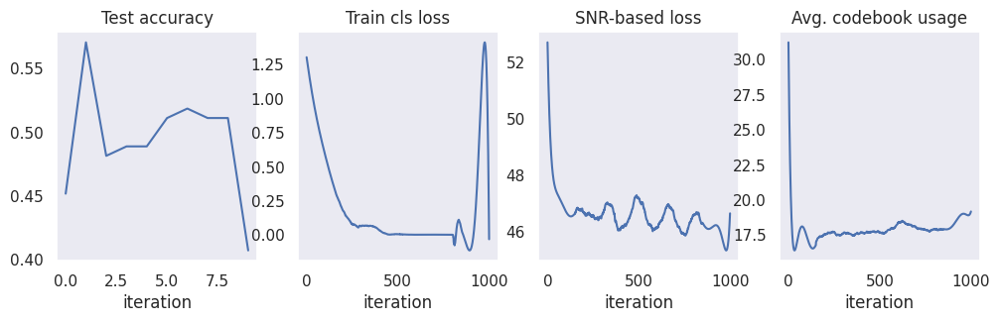

In [24]:
visualize_training_curves(
    test_accuracy, train_res_cls_loss,
    train_res_recon_error, train_res_perplexity
)

In [25]:
emb_data = model.vq_vae.embedding.weight.data.cpu()
emb_color, zcs = get_embedding_color(emb_data)

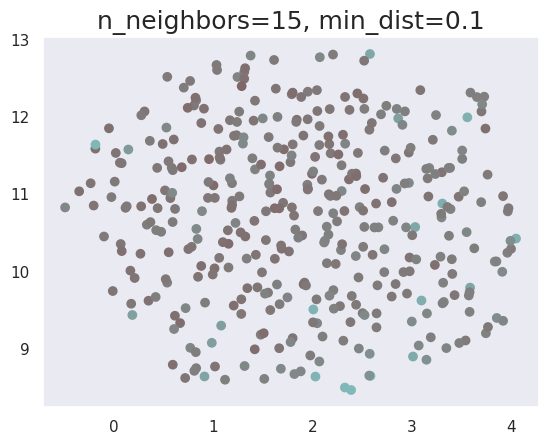

In [26]:
k = 15
min_dist=0.1
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

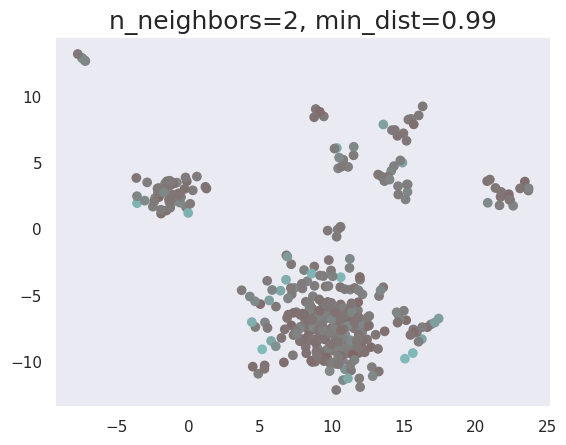

In [27]:
k = 2
min_dist=0.99
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

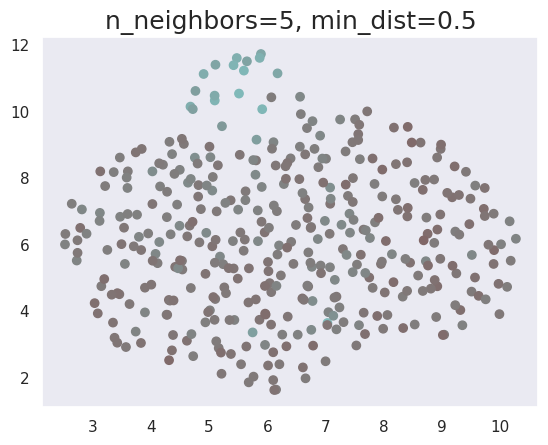

In [28]:
k = 5
min_dist=0.5
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='braycurtis', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 5
min_dist=0.8
visualize_embedding_umap(emb_data, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='braycurtis', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

/opt/anaconda3/envs/audio/lib/python3.9/site-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


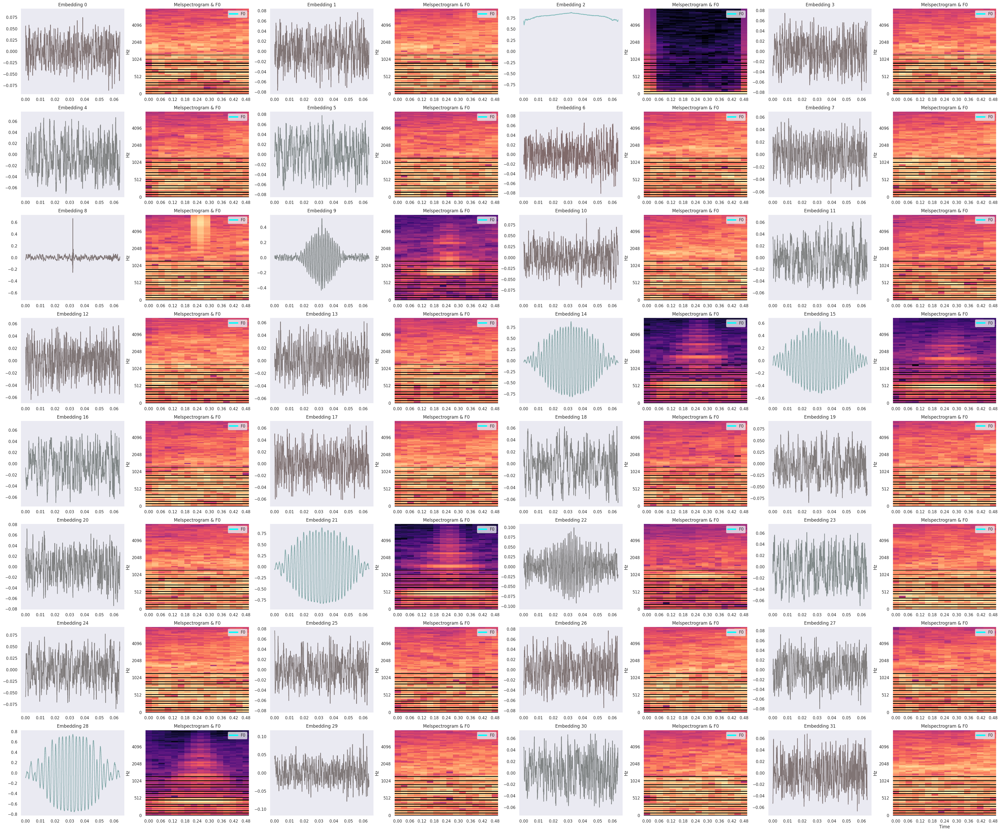

In [29]:
visualize_speech_codebook(emb_data.numpy(), n=64, colors=emb_color)

In [30]:
torch.topk(zcs, 32)

torch.return_types.topk(
values=tensor([0.7311, 0.7241, 0.7194, 0.7170, 0.7074, 0.7049, 0.6951, 0.6863, 0.6825,
        0.6774, 0.6671, 0.6566, 0.6539, 0.6486, 0.6405, 0.6269, 0.6269, 0.6187,
        0.6187, 0.5991, 0.5678, 0.5620, 0.5606, 0.5519, 0.5519, 0.5446, 0.5431,
        0.5417, 0.5417, 0.5402, 0.5402, 0.5402]),
indices=tensor([  2, 271, 112, 105, 157, 347, 168, 216,  34, 352, 283,  28,  21,  15,
         14, 107, 159,  96, 323,  93, 142, 219, 109, 231, 383, 238,  88, 280,
        324, 298,  56, 350]))

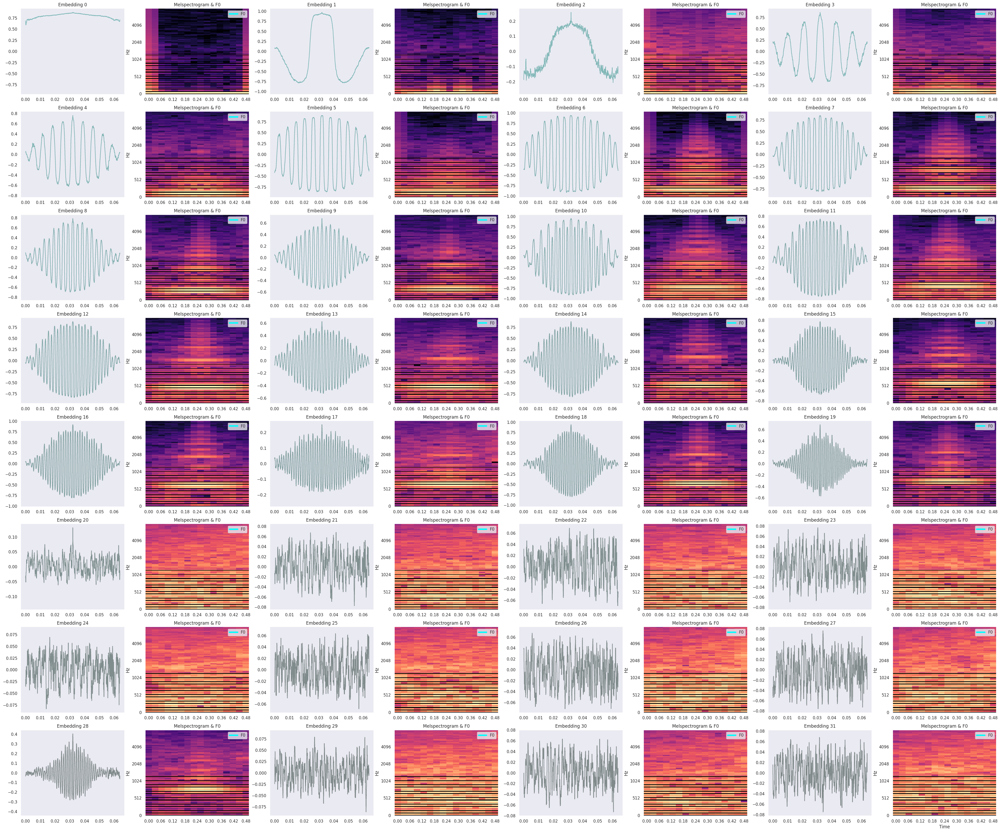

In [31]:
selected_emb_topk = torch.topk(zcs, 32)
selected_emb = emb_data.index_select(dim=0, index=selected_emb_topk.indices)
selected_emb_color = torch.stack(
        [torch.full_like(selected_emb_topk.values, 0.5), 
         selected_emb_topk.values, selected_emb_topk.values], 
        dim=-1).numpy()
visualize_speech_codebook(selected_emb.numpy(), n=64, colors=selected_emb_color)

In [32]:
from IConNet.acov.audio import AudioLibrosa

In [33]:
selected_emb_np = selected_emb.numpy()

In [34]:
from IPython.display import display

In [35]:
selected_voiced_idx = selected_emb_topk.indices
selected_voiced_idx

tensor([  2, 271, 112, 105, 157, 347, 168, 216,  34, 352, 283,  28,  21,  15,
         14, 107, 159,  96, 323,  93, 142, 219, 109, 231, 383, 238,  88, 280,
        324, 298,  56, 350])

In [36]:
emb_np = emb_data.numpy()
for i in selected_voiced_idx:
    title=f'Voiced Embedding {i}'
    top_audio = AudioLibrosa(
        y=emb_np[i], 
        sr=sr, title=title,
        features_f0=False, features_fft=False, features_cqt=False
    )
    top_audio.extract_features()
    print(title)
    display(top_audio.player)

Voiced Embedding 2


Voiced Embedding 271


Voiced Embedding 112


Voiced Embedding 105


Voiced Embedding 157


Voiced Embedding 347


Voiced Embedding 168


Voiced Embedding 216


Voiced Embedding 34


Voiced Embedding 352


Voiced Embedding 283


Voiced Embedding 28


Voiced Embedding 21


Voiced Embedding 15


Voiced Embedding 14


Voiced Embedding 107


Voiced Embedding 159


Voiced Embedding 96


Voiced Embedding 323


Voiced Embedding 93


Voiced Embedding 142


Voiced Embedding 219


Voiced Embedding 109


Voiced Embedding 231


Voiced Embedding 383


Voiced Embedding 238


Voiced Embedding 88


Voiced Embedding 280


Voiced Embedding 324


Voiced Embedding 298


Voiced Embedding 56


Voiced Embedding 350


In [37]:
from IConNet.acov.audio_viz import (
    feature_librosa, play_and_visualize, show_feature)

def display_embedding(i, title_prefix="Voiced "):
    title=f'{title_prefix}Embedding {i}'
    audio_top = AudioLibrosa(
        y=emb_np[i], 
        sr=sr, title=title,
        win_length=256
    )
    audio_top.extract_features()
    print(title)
    show_feature(audio_top)
    display(audio_top.player)

Voiced Embedding 2



Voiced Embedding 271



Voiced Embedding 112



Voiced Embedding 105



Voiced Embedding 157



Voiced Embedding 347



Voiced Embedding 168



Voiced Embedding 216



Voiced Embedding 34



Voiced Embedding 352



Voiced Embedding 283



Voiced Embedding 28



Voiced Embedding 21



Voiced Embedding 15



Voiced Embedding 14



Voiced Embedding 107



Voiced Embedding 159



Voiced Embedding 96



Voiced Embedding 323



Voiced Embedding 93



Voiced Embedding 142



Voiced Embedding 219



Voiced Embedding 109



Voiced Embedding 231



Voiced Embedding 383



Voiced Embedding 238



Voiced Embedding 88



Voiced Embedding 280



Voiced Embedding 324



Voiced Embedding 298



Voiced Embedding 56



Voiced Embedding 350



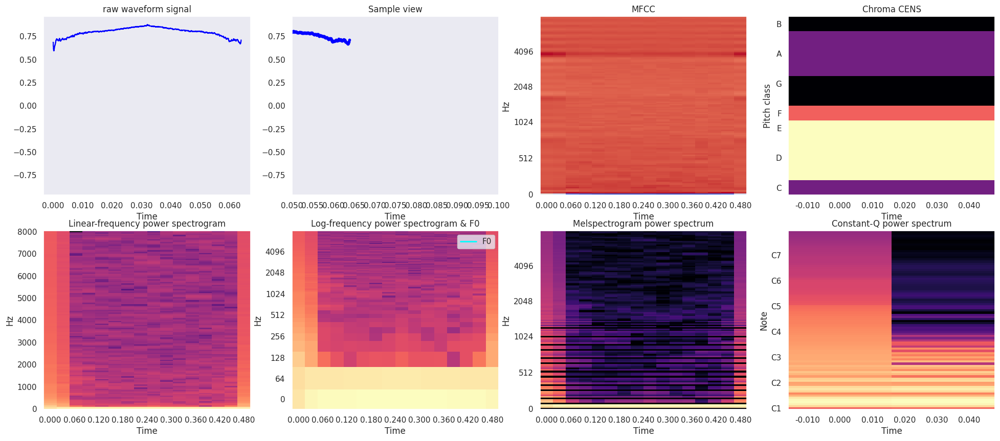

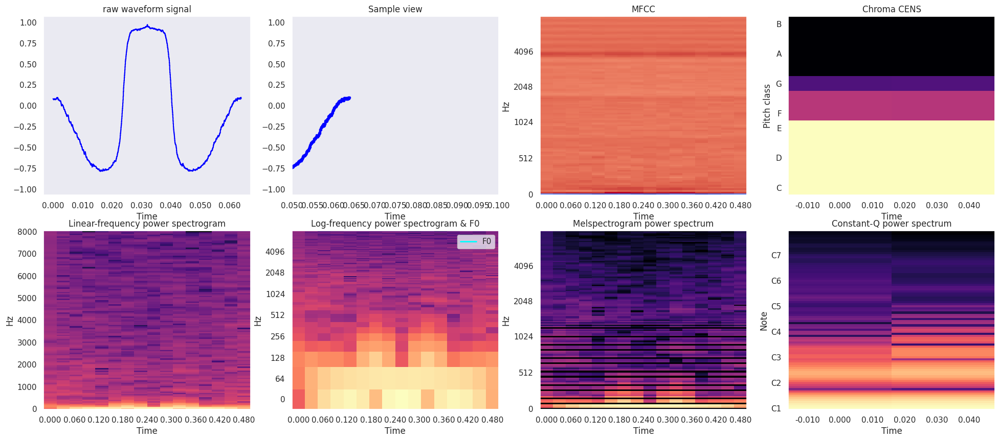

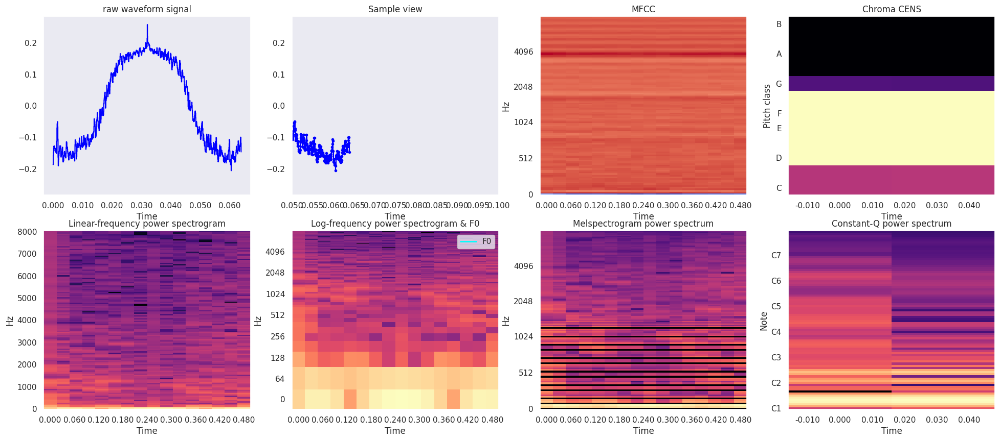

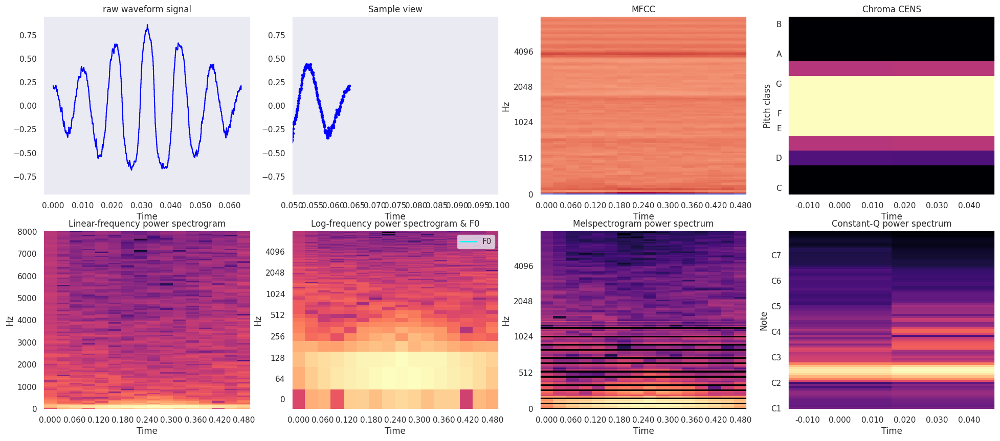

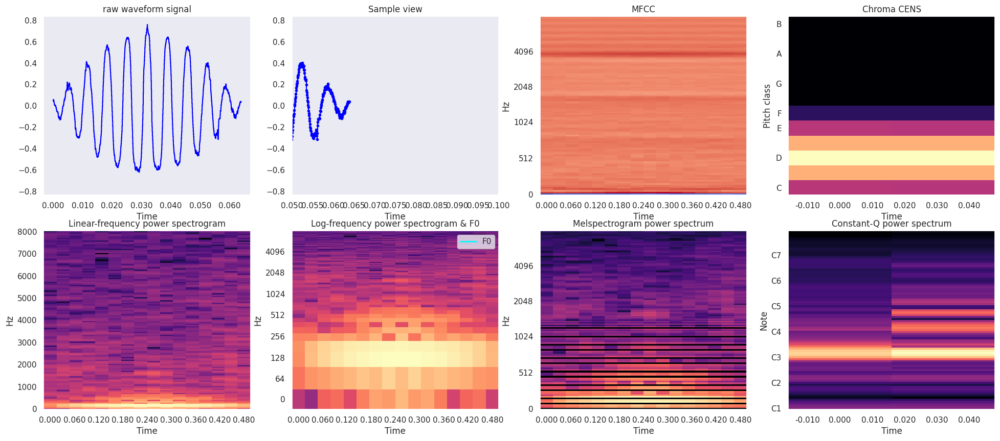

...

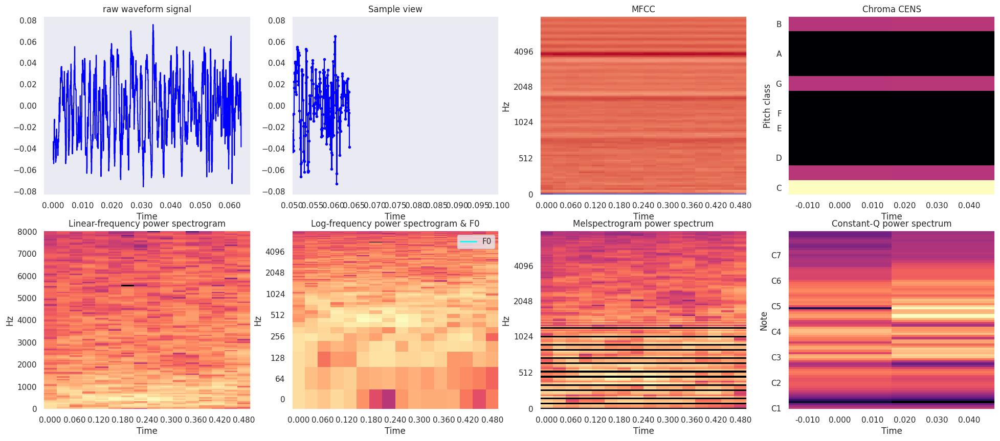

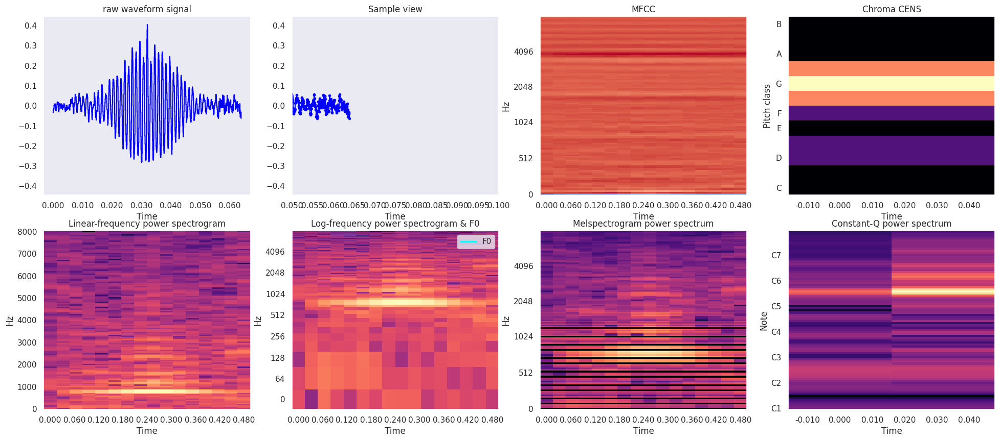

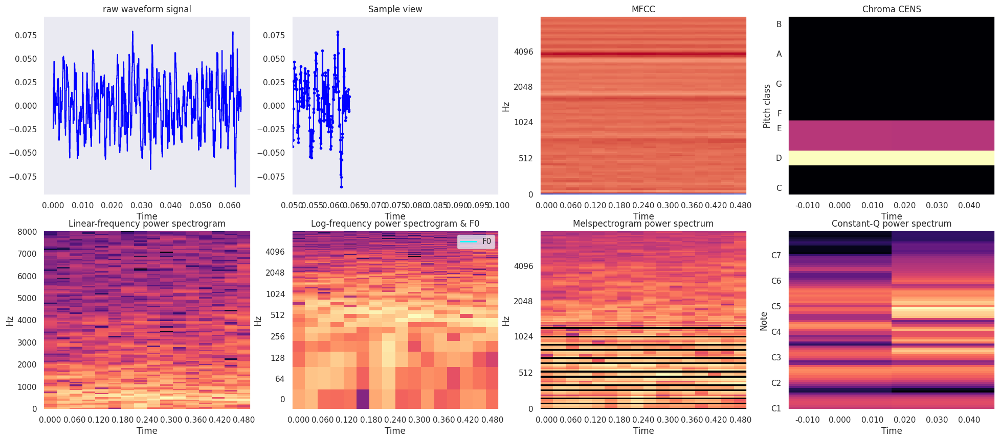

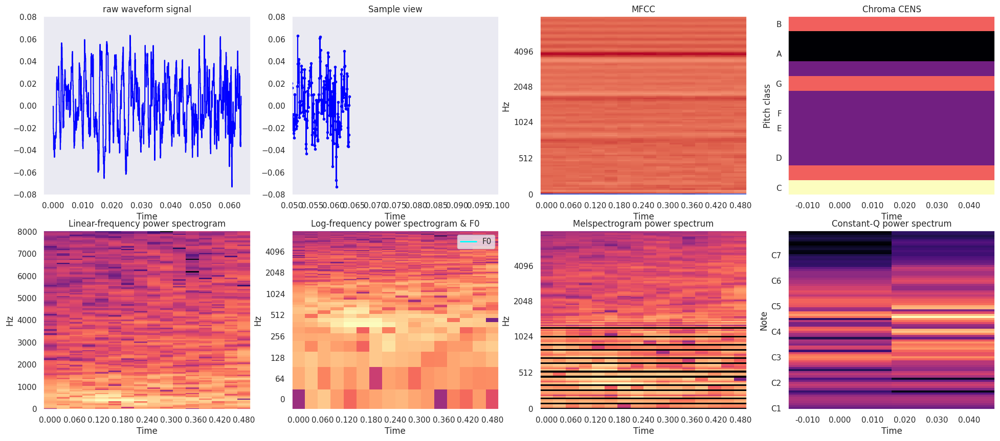

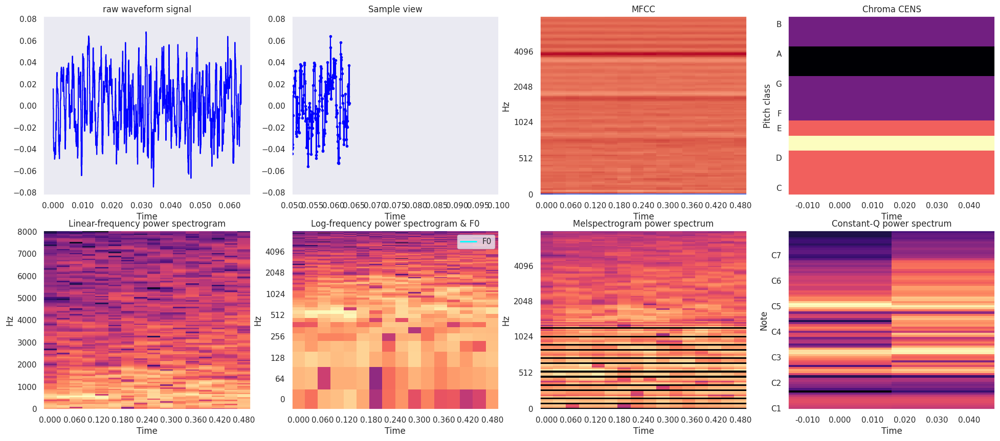

In [38]:
for ii in range(32):
    display_embedding(selected_voiced_idx[ii])

In [40]:
best_acc = 0.5

In [ ]:
num_training_updates = 1000
additional_steps = 11000
for i in range(num_training_updates, num_training_updates+additional_steps):
    (data, target) = next(iter(train_loader))
    data = data.to(device)
    target = target.to(device)
    optimizer.zero_grad()

    logits, vq_loss, recon_loss, perplexity = model(data)
    cls_loss = F.cross_entropy(logits.squeeze(), target)
    loss = vq_loss + recon_loss + 0.1*cls_loss
    loss.backward()
    optimizer.step()

    train_res_recon_error.append(recon_loss.item())
    train_res_perplexity.append(perplexity.item())
    train_res_cls_loss.append(cls_loss.item())

    del data, target
    gc.collect()
    torch.cuda.empty_cache() 

    if (i+1) % log_interval == 0:
        print('%d iterations' % (i+1))
        print('cls_loss: %.3f' % np.mean(train_res_cls_loss[-log_interval:]))
        print('recon_error: %.3f' % np.mean(train_res_recon_error[-log_interval:]))
        print('perplexity: %.3f' % np.mean(train_res_perplexity[-log_interval:]))
        print()
    if (i+1) % test_interval == 0:
        model.eval()
        acc = test(model, i+1)
        test_accuracy.append(acc)
        model.train()

        if best_acc < acc:
            best_acc = acc
            model_path = f'../linh_scb6.model.ravdess.step{i+1}.pt'
            torch.save(model.state_dict(), model_path)
        

1100 iterations
cls_loss: 0.299
recon_error: 46.253
perplexity: 18.697

Test iter: 1100	Accuracy: 66/135 (49%)

1200 iterations
cls_loss: 0.074
recon_error: 46.053
perplexity: 18.990

Test iter: 1200	Accuracy: 72/135 (53%)

1300 iterations
cls_loss: 0.030
recon_error: 45.707
perplexity: 19.087

Test iter: 1300	Accuracy: 67/135 (50%)

1400 iterations
cls_loss: 0.011
recon_error: 45.275
perplexity: 19.205

Test iter: 1400	Accuracy: 72/135 (53%)



In [ ]:
visualize_training_curves(
    test_accuracy, train_res_cls_loss,
    train_res_recon_error, train_res_perplexity
)

In [44]:
emb_data2 = model.vq_vae.embedding.weight.data.cpu()
emb_color, zcs = get_embedding_color(emb_data2)

In [ ]:
k = 15
min_dist=0.1
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.99
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 5
min_dist=0.5
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='braycurtis', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.9999
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='minkowski', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.99
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='chebyshev', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.9
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='chebyshev', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.9999
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='chebyshev', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
k = 2
min_dist=0.99
visualize_embedding_umap(emb_data2, colors=emb_color, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='manhattan', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [ ]:
visualize_speech_codebook(emb_data2.numpy(), n=64, colors=emb_color)

In [ ]:
selected_emb_topk2 = torch.topk(zcs, 32)
selected_voiced_idx2 = selected_emb_topk2.indices
selected_emb2 = emb_data2.index_select(dim=0, index=selected_voiced_idx2)
selected_emb_color2 = torch.stack(
        [torch.full_like(selected_emb_topk2.values, 0.5), 
         selected_emb_topk2.values, selected_emb_topk2.values], 
        dim=-1).numpy()
visualize_speech_codebook(selected_emb2.numpy(), n=64, colors=selected_emb_color2)

In [ ]:
emb_np2 = emb_data2.numpy()
for i in selected_voiced_idx2:
    title=f'Voiced Embedding {i}'
    top_audio = AudioLibrosa(
        y=emb_np2[i], 
        sr=sr, title=title,
        features_f0=False, features_fft=False, features_cqt=False
    )
    top_audio.extract_features()
    print(title)
    display(top_audio.player)

In [ ]:
for ii in range(32):
    display_embedding(selected_voiced_idx2[ii])

In [63]:
model_path = '../linh_scb6.model.ravdess.step12k.pt'
torch.save(model.state_dict(), model_path)

In [64]:
np.save(
    '../linh_scb6.audio_embedding.ravdess.step1k.npy', 
    emb_data.numpy(), allow_pickle=True)

In [66]:
np.save(
    '../linh_scb6.audio_embedding.ravdess.step12k.npy', emb_data3.numpy(), allow_pickle=True)

In [87]:
def get_embedding_color2(    
    y: Tensor,
    n_fft: int = 1024,
    stride: int = 256
) -> Tensor:
    """Compute the zero-crossing score of the codebook embedding.

    Returns
    -------
    zcr : np.ndarray [shape=(..., 1, t)]
        ``zcr[..., 0, i]`` is the zero crossing score in frame ``i`` 
        with score in range [0,1]
    """
    crossings = zero_crossings(y, dtype=torch.float)
    zcrate = crossings.mean(dim=-1)
    nonzero_mean = torch.where(
        crossings>0, crossings, 0.0).mean(dim=-1)
    score = F.sigmoid(1 - 8*zcrate + 2*nonzero_mean)
    n = score.shape[0] //2

    dataset_idx = torch.concatenate([
        torch.full((n,), 0.3), torch.full((n,), 0.7)], dim=0)
    
    color = torch.stack(
        [dataset_idx, score, score], 
        dim=-1).numpy()
    return color, score

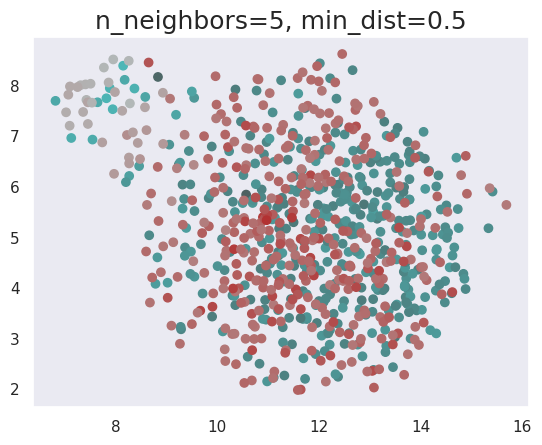

In [88]:
emb_2ds = torch.Tensor(np.vstack([emb_data_cremad, emb_np2]))
emb_color_2ds, zcs_2ds = get_embedding_color2(emb_2ds)
k = 5
min_dist=0.5
visualize_embedding_umap(emb_2ds, colors=emb_color_2ds, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

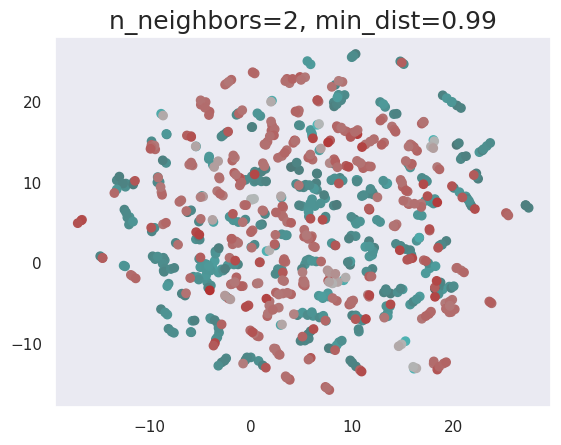

In [89]:
k = 2
min_dist=0.99
visualize_embedding_umap(emb_2ds, colors=emb_color_2ds, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='braycurtis', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

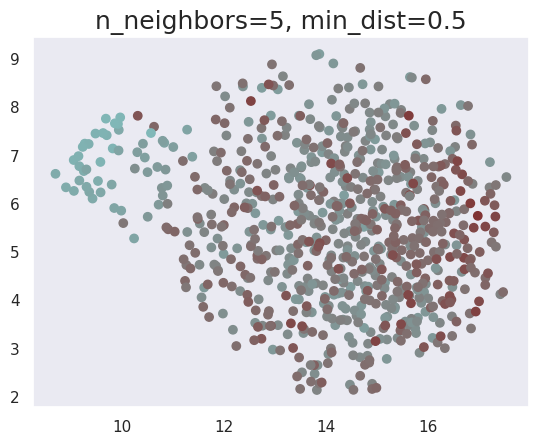

In [86]:
emb_2ds = torch.Tensor(np.vstack([emb_data_cremad, emb_np2]))
emb_color_2ds, zcs_2ds = get_embedding_color(emb_2ds)
k = 5
min_dist=0.5
visualize_embedding_umap(emb_2ds, colors=emb_color_2ds, edgecolors=None,
          n_neighbors=k, min_dist=min_dist, metric='euclidean', 
          title=f'n_neighbors={k}, min_dist={min_dist}')

In [94]:
from torchmetrics.classification import (
    MulticlassAccuracy, MulticlassPrecision, 
    MulticlassRecall, MulticlassF1Score, 
    MulticlassConfusionMatrix,
    MulticlassAUROC
)
from torchmetrics import MetricCollection
from pprint import pprint

@torch.no_grad
def report_metrics(model, labels=labels, 
                   test_loader=test_loader, device=device):
    n = len(labels)
    metrics = MetricCollection({
        'acc_unweighted': MulticlassAccuracy(num_classes=n), 
        'acc_weighted': MulticlassAccuracy(num_classes=n, average='weighted'), 
        
        'f1s': MulticlassF1Score(num_classes=n),  
        'uar': MulticlassRecall(num_classes=n, average='macro'), 
        'wap': MulticlassPrecision(num_classes=n, average='weighted'),
        
        'f1s_detail': MulticlassF1Score(num_classes=n, average=None),  
        'acc_detail': MulticlassAccuracy(num_classes=n, average=None), 
        'precision_detail': MulticlassPrecision(num_classes=n, average=None),
        'recall_detail': MulticlassRecall(num_classes=n, average=None), 
        'rocauc': MulticlassAUROC(num_classes=n, average=None, thresholds=None)
    }
    # , compute_groups=[['acc', 'f1s', 'wap'], ['uap', 'uar']]
                              ).to(device)
    confusion_matrix = MulticlassConfusionMatrix(num_classes=n).to(device)
    model.eval()
    correct = 0
    total = 0
    for data, target in test_loader:
        total += len(target)
        
        data = data.to(device)
        target = target.to(device)
        logits, _,_,_ = model(data)
        del data
        gc.collect()
        torch.cuda.empty_cache()
        probs = F.softmax(logits.squeeze(), dim=-1)
        pred = probs.argmax(dim=-1)
        correct += pred.eq(target).sum().item()
        
        metrics.update(probs, target)
        confusion_matrix.update(pred, target)
        
        del target
        gc.collect()
        torch.cuda.empty_cache()
    print(f'Correct: {correct}/{total} ({correct/total:.4f})')
    return metrics, confusion_matrix

In [ ]:
metrics, confusion_matrix = report_metrics(
    model, labels=labels, device=device)
pprint(metrics.compute())
confusion_matrix.compute()